## Text, Image and Table extraction from Json files 


Instructions: 
<br> <br>
To run this code successfully, we will need to download the folders "data" and "images" respectively from the Onedrive on Teams. 
- Ensure that you keep this python notebook in your "data" folder. Also, "images" folder should be in the same directory as that of the "data" folder. 
- The first module returns all the images and tables with their respective captions which can be used to study the key-words
- The second module will be used to extract images and table with respect to the keywords and then train our model. 

In [1]:
#import all the nessed packages 
import json
import pandas as pd
import numpy as np
import PyPDF2
import textract
import re
import os
from collections import Counter
import random
import glob
from PIL import Image



random = np.random.random ([8,90])
#import all the files from the data folder 
files = os.listdir()

In [2]:
os.listdir('../images/')

['1-s2.0-S0016236118304502-main-Table3-1.png',
 '1-s2.0-S004896971831547X-main-Table3-1.png',
 '1-s2.0-S096085241730038X-main-Figure2-1.png',
 '1-s2.0-S0306261918310110-main-Table2-1.png',
 '1-s2.0-S096085241100006X-main-Table2-1.png',
 '1-s2.0-S096085241100006X-main-Figure4-1.png',
 '1-s2.0-S096085241301540X-main-Figure4-1.png',
 '1-s2.0-S0378382018307574-main-Table9-1.png',
 '1-s2.0-S096085241301540X-main-Table2-1.png',
 '1-s2.0-S004896971831547X-main-Table1-1.png',
 '1-s2.0-S0016236118304502-main-Table1-1.png',
 '1-s2.0-S0306261919313431-main-Figure8-1.png',
 '1-s2.0-S0016236118304502-main-Table5-1.png',
 '1-s2.0-S0016236118318489-main-Figure8-1.png',
 '1-s2.0-S0306261918310110-main-Table6-1.png',
 '1-s2.0-S096085241100006X-main-Figure2-1.png',
 '1-s2.0-S096085241301540X-main-Figure2-1.png',
 '1-s2.0-S096085241100006X-main-Table4-1.png',
 '1-s2.0-S0306261918310110-main-Table4-1.png',
 '1-s2.0-S0016236118304502-main-Table7-1.png',
 '1-s2.0-S0378382018307574-main-Table8-1.png',
 '1-s2

### Module 1 :  Figures with Captions

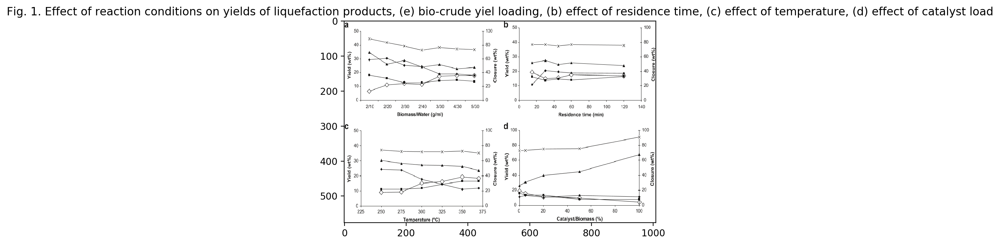

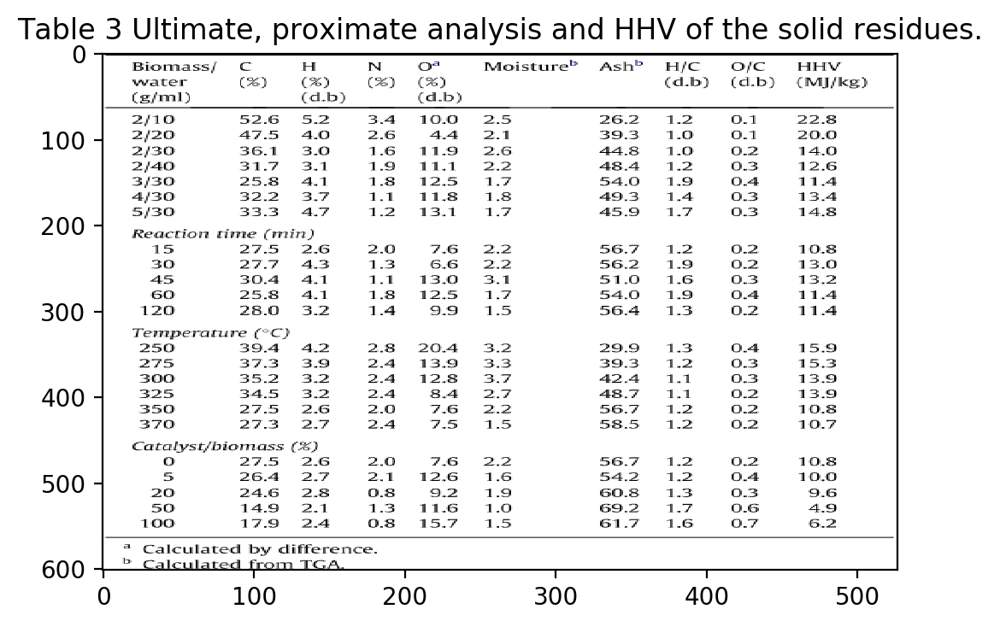

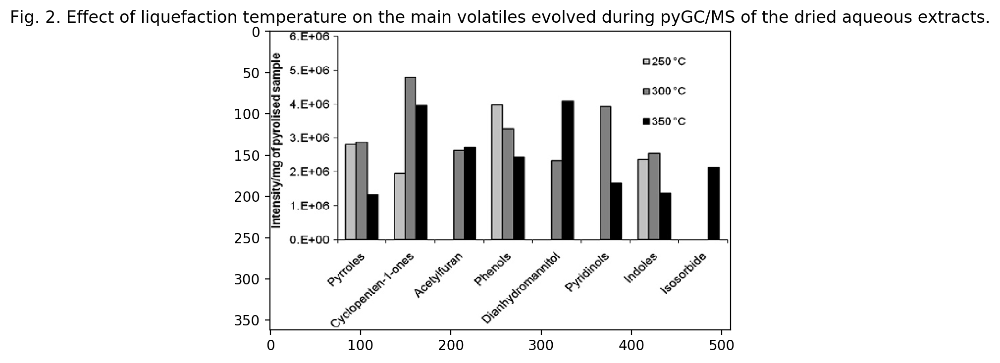

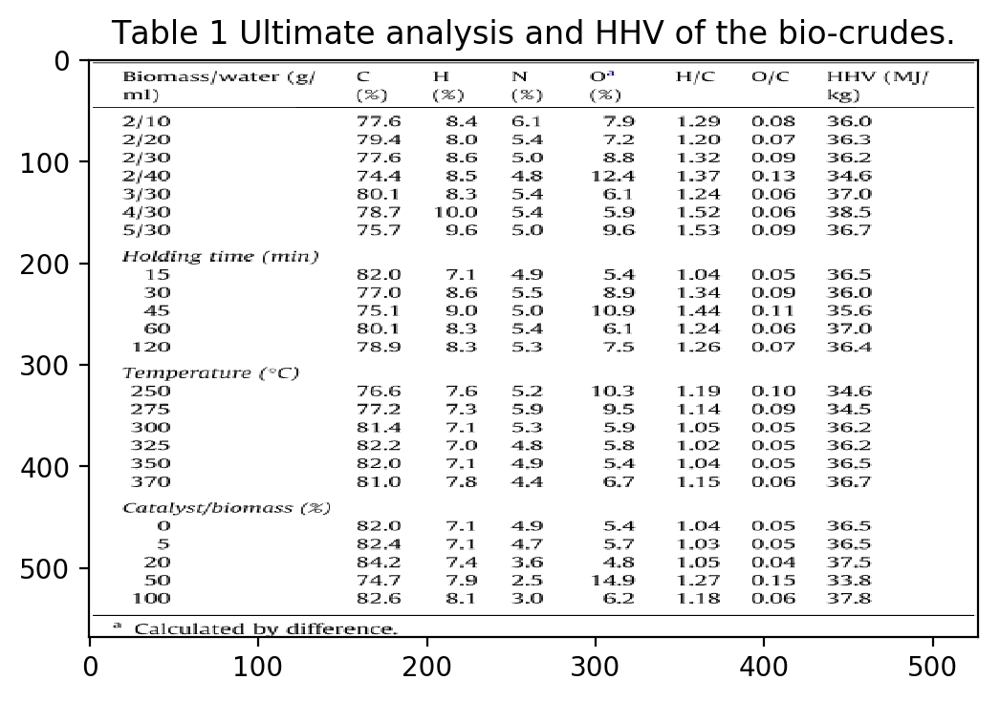

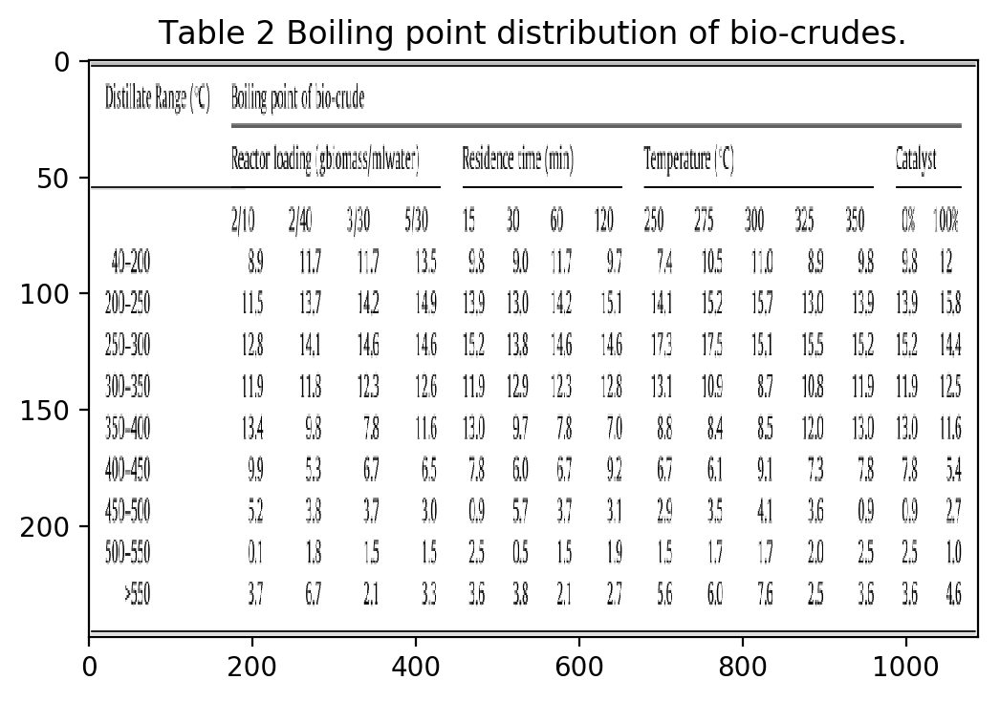

...

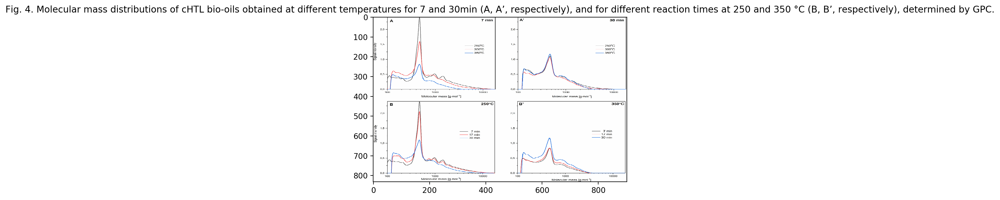

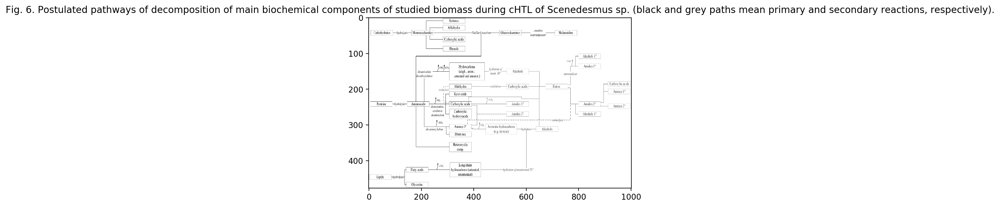

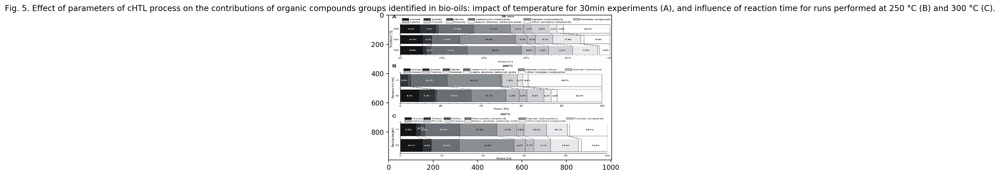

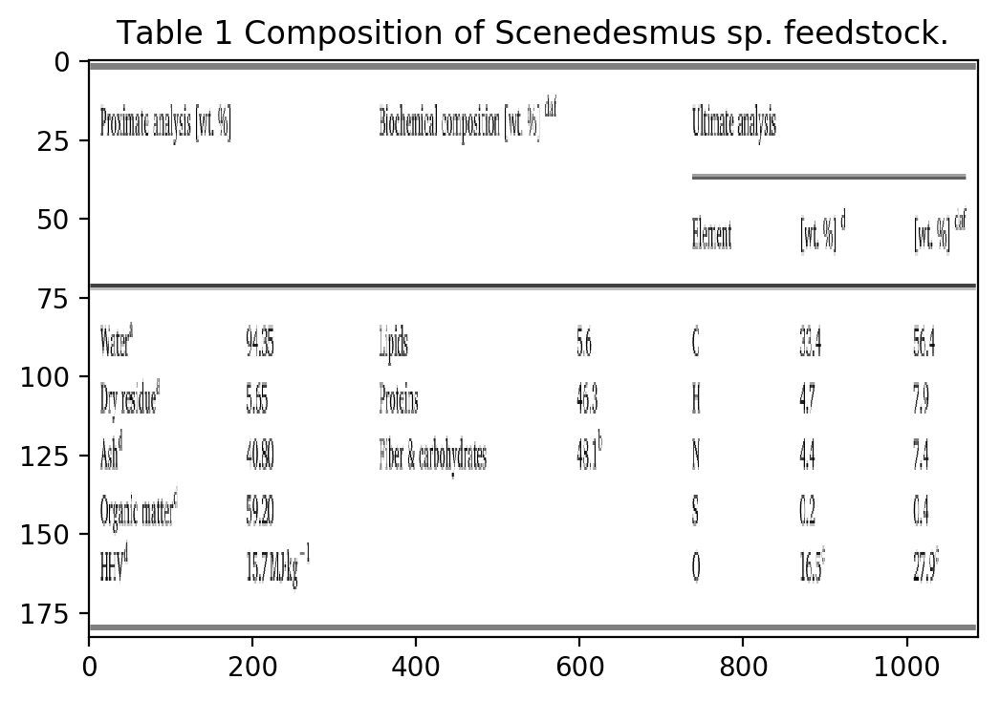

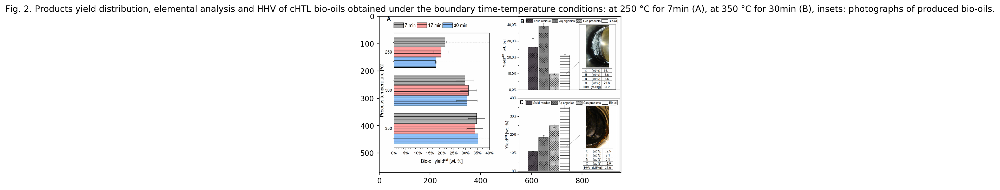

In [10]:
import matplotlib.pyplot as plt
for file in files:
    if re.findall(".json$",file):
        #print(file)
        with open(file) as f:
            data = json.load(f)
            for i in range(len(data)):
                res = [data[i]['renderURL'][6:] , data[i]['caption']]
                if res[0] in os.listdir('../images/'):
                    img = Image.open("../images/" + res[0])
#                     print(res[1])
                    plt.figure(dpi = 200)
                    plt.title(res[1])
                    plt.imshow(img, aspect='auto')
                    plt.show()


### Module 2 : Image/Table selection by using keywords

In [4]:
image_data = []
keywords = ['gc-ms', 'bio-oil','light', 'hemi-cellulose', 'biochemical-composition', 'heavy','protein','organic',
        'biochar', 'solid', 'lipid' , 'dichloromethane']
for file in files:
    if re.findall(".json$",file):
        #print(file)
        with open(file) as f:
            data = json.load(f)
            #print(data[0])
            for i in range(len(data)):
                res = [ data[i]['renderURL'][6:] for word in keywords if(word in data[i]['caption'] and data[i]['figType'] == "Figure") ]
                if res != [] :
                    image_data.append(list(set(res)))
                #print("yes", data[i]['renderURL'])
               # print(data[i]['renderURL'])
           # json_data.append(data)
            
        
            


In [5]:
image_data

[['1-s2.0-S2211926417305477-main-Figure4-1.png'],
 ['1-s2.0-S2211926417305477-main-Figure5-1.png'],
 ['1-s2.0-S2211926417305477-main-Figure2-1.png'],
 ['1-s2.0-S0960852413011917-main-Figure1-1.png'],
 ['1-s2.0-S0960852416305545-main-Figure2-1.png'],
 ['1-s2.0-S0960852416305545-main-Figure4-1.png'],
 ['1-s2.0-S2211926415300734-main-Figure2-1.png'],
 ['1-s2.0-S2211926415300734-main-Figure4-1.png'],
 ['1-s2.0-S0960852416314961-main-Figure2-1.png'],
 ['acs.est.8b04035-Figure3-1.png'],
 ['acs.est.8b04035-Figure1-1.png'],
 ['acs.est.8b04035-Figure5-1.png'],
 ['acs.est.8b04035-Figure2-1.png'],
 ['acs.est.8b04035-Figure6-1.png'],
 ['1-s2.0-S2211926414000691-main-Figure1-1.png'],
 ['1-s2.0-S2211926414000691-main-Figure3-1.png'],
 ['1-s2.0-S2211926414000691-main-Figure2-1.png'],
 ['energies-10-00467-Figure3-1.png'],
 ['energies-10-00467-Figure3-1.png'],
 ['energies-10-00467-Figure4-1.png'],
 ['energies-10-00467-Figure4-1.png'],
 ['energies-10-00467-Figure2-1.png'],
 ['energies-10-00467-Figure2-1

In [6]:
set_images   = np.array(image_data)
len(set_images.flatten())
# flattening the 2-d list of images in order to pass it from the images folder 
set_images.flatten()

array(['1-s2.0-S2211926417305477-main-Figure4-1.png',
       '1-s2.0-S2211926417305477-main-Figure5-1.png',
       '1-s2.0-S2211926417305477-main-Figure2-1.png',
       '1-s2.0-S0960852413011917-main-Figure1-1.png',
       '1-s2.0-S0960852416305545-main-Figure2-1.png',
       '1-s2.0-S0960852416305545-main-Figure4-1.png',
       '1-s2.0-S2211926415300734-main-Figure2-1.png',
       '1-s2.0-S2211926415300734-main-Figure4-1.png',
       '1-s2.0-S0960852416314961-main-Figure2-1.png',
       'acs.est.8b04035-Figure3-1.png', 'acs.est.8b04035-Figure1-1.png',
       'acs.est.8b04035-Figure5-1.png', 'acs.est.8b04035-Figure2-1.png',
       'acs.est.8b04035-Figure6-1.png',
       '1-s2.0-S2211926414000691-main-Figure1-1.png',
       '1-s2.0-S2211926414000691-main-Figure3-1.png',
       '1-s2.0-S2211926414000691-main-Figure2-1.png',
       'energies-10-00467-Figure3-1.png',
       'energies-10-00467-Figure3-1.png',
       'energies-10-00467-Figure4-1.png',
       'energies-10-00467-Figure4-1.png'

In [7]:
# flattening the 2-d list of images in order to pass it from the images folder 
set_images.flatten()

array(['1-s2.0-S2211926417305477-main-Figure4-1.png',
       '1-s2.0-S2211926417305477-main-Figure5-1.png',
       '1-s2.0-S2211926417305477-main-Figure2-1.png',
       '1-s2.0-S0960852413011917-main-Figure1-1.png',
       '1-s2.0-S0960852416305545-main-Figure2-1.png',
       '1-s2.0-S0960852416305545-main-Figure4-1.png',
       '1-s2.0-S2211926415300734-main-Figure2-1.png',
       '1-s2.0-S2211926415300734-main-Figure4-1.png',
       '1-s2.0-S0960852416314961-main-Figure2-1.png',
       'acs.est.8b04035-Figure3-1.png', 'acs.est.8b04035-Figure1-1.png',
       'acs.est.8b04035-Figure5-1.png', 'acs.est.8b04035-Figure2-1.png',
       'acs.est.8b04035-Figure6-1.png',
       '1-s2.0-S2211926414000691-main-Figure1-1.png',
       '1-s2.0-S2211926414000691-main-Figure3-1.png',
       '1-s2.0-S2211926414000691-main-Figure2-1.png',
       'energies-10-00467-Figure3-1.png',
       'energies-10-00467-Figure3-1.png',
       'energies-10-00467-Figure4-1.png',
       'energies-10-00467-Figure4-1.png'

In [8]:

train = []
images = glob.glob("../images/*.png")
#print(len(images))
for image in images:
    #print(image)
    if(image[10:] in set_images.flatten()):
        #print(image)
        with open(image, 'rb') as file:
#             print(file)
            img = Image.open(file)
            img.show()
            train.append(img)

In [9]:
train

[<PIL.PngImagePlugin.PngImageFile image mode=RGB size=500x768 at 0x117EF1A90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=615x361 at 0x117D03990>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1036x561 at 0x117D03A90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=479x281 at 0x117D03610>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1004x991 at 0x117ECAC10>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1017x706 at 0x117ECAF10>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=827x1126 at 0x117ECAED0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=827x1297 at 0x117ECAE90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=661x1083 at 0x117ECAC50>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=493x483 at 0x117ECAF90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1087x73 at 0x117ECAB90>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGB size=902x831 at 0x117ECAF50>,
 <PIL.PngImagePlugin.PngImageFile image mode=R